In [116]:
import sys
sys.path.append(r'C:\Users\Projects')
from treebricks import GalaxyCatalog
import treebricks as tb
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage import gaussian_filter
from numpy.fft import fftn, ifftn, fftfreq
from sklearn.decomposition import PCA

file_path = r'C:\Users\Projects\tree_bricks970'
gc = GalaxyCatalog(file_path)

nbodies: [337682774] mpart: [8.59259648e-08] aexp: [0.82587326] omega_t: [0.39877856] age: [11.21741055] nsub: [1186 4248] nmax: 5434
Reading galaxies took 13.18 secs.
Total time was 13.18 secs.


In [117]:
dict_galaxy = gc.treebricks_dict['galaxies'][0]
print(dict_galaxy.keys())

dict_keys(['npart', 'members', 'my_number', 'my_timestep', 'level', 'host_gal', 'host_subgal', 'nchild', 'nextsub', 'mass', 'px', 'py', 'pz', 'vx', 'vy', 'vz', 'Lx', 'Ly', 'Lz', 'rmax', 'a', 'b', 'c', 'ek', 'ep', 'et', 'spin', 'sigma', 'sigma_bulge', 'm_bulge', 'rvir', 'mvir', 'tvir', 'cvel', 'rho_0', 'r_c', 'rr'])


In [118]:
galaxies = [g for g in gc.treebricks_dict['galaxies'] if 'mass' in g and 'px' in g]

# Select red dwarf candidates (example: mass < 1e10 Msun)
mass_threshold = 1e10  # adjust as needed
dwarfs = [g for g in galaxies if g['mass'][0] < mass_threshold]

# Pull positions and masses into arrays
positions = np.array([[g['px'], g['py'], g['pz']] for g in dwarfs])
masses = np.array([g['mass'][0] for g in dwarfs])

Total galaxies: 5434


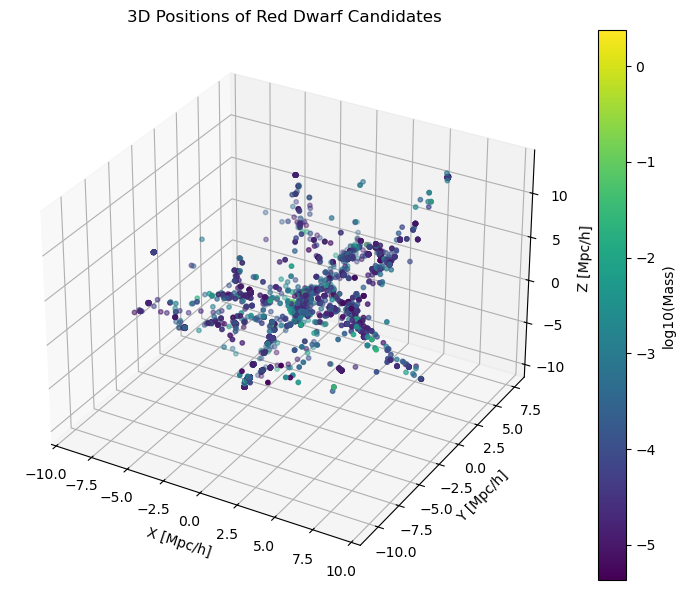

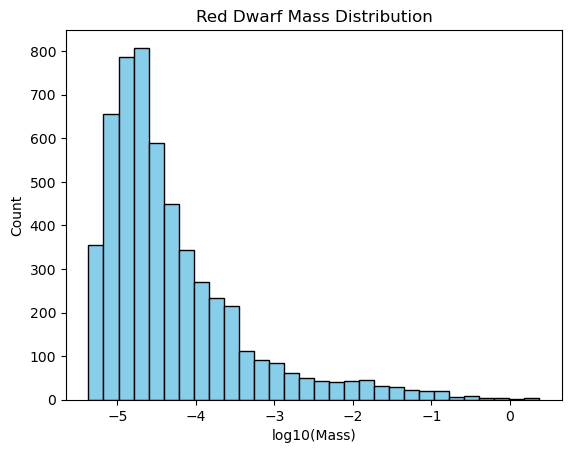

In [5]:
print(f"Total galaxies: {len(galaxies)}")

# 3D Spatial Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2],
                c=np.log10(masses), cmap='viridis', s=10)
plt.colorbar(sc, label='log10(Mass)')
ax.set_title("3D Positions of Red Dwarf Candidates")
ax.set_xlabel("X [Mpc/h]")
ax.set_ylabel("Y [Mpc/h]")
ax.set_zlabel("Z [Mpc/h]")
plt.tight_layout()
plt.show()

# Histogram
plt.hist(np.log10(masses), bins=30, color='skyblue', edgecolor='k')
plt.xlabel("log10(Mass)")
plt.ylabel("Count")
plt.title("Red Dwarf Mass Distribution")
plt.show()

In [6]:
# Use number of neighbors within a given radius
radius = 5.0
nbrs = NearestNeighbors(radius=radius).fit(positions)
density = np.array([len(nbrs.radius_neighbors([pos], return_distance=False)[0]) for pos in positions])

# Bin into 5 quantile-based density levels 
quantiles = np.quantile(density, [0.2, 0.4, 0.6, 0.8])
density_bins = np.digitize(density, quantiles)

In [7]:
# Define labels and colors
labels = ["Very Low", "Low", "Medium", "High", "Very High"]
colors = ["#636EFA", "#00CC96", "#AB63FA", "#FFA15A", "#EF553B"]

# Plotly Interactive Plot ---
fig = go.Figure()

for i in range(5):
    idx = density_bins == i
    fig.add_trace(go.Scatter3d(
        x=positions[idx, 0],
        y=positions[idx, 1],
        z=positions[idx, 2],
        mode='markers',
        name=f"{labels[i]} Density",
        marker=dict(
            size=3,
            color=colors[i],
            opacity=0.8
        )
    ))

# --- Layout ---
fig.update_layout(
    scene=dict(
        xaxis_title='X [Mpc/h]',
        yaxis_title='Y [Mpc/h]',
        zaxis_title='Z [Mpc/h]'
    ),
    title='Red Dwarf Candidates by Local Density (5 Classes)',
    margin=dict(l=0, r=0, b=0, t=40),
    showlegend=True
)

fig.show()

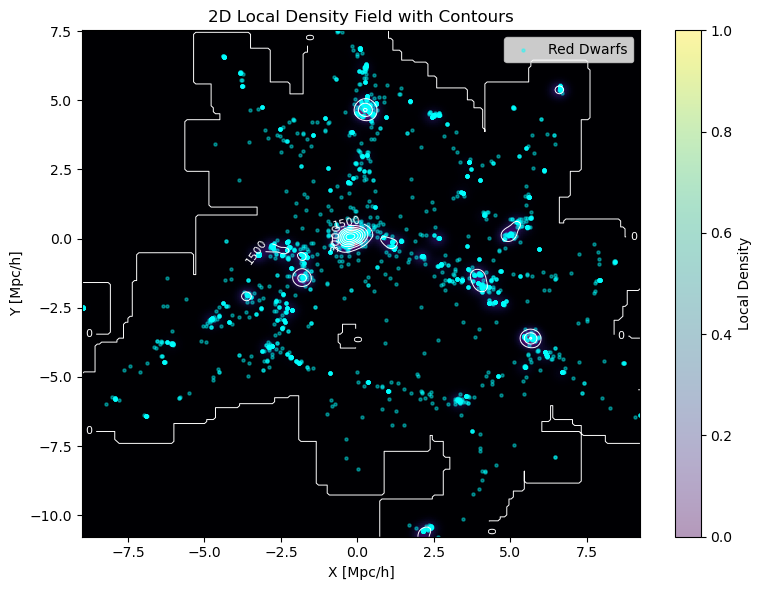

In [8]:
# Project to XY plane
x = positions[:, 0]
y = positions[:, 1]

# Make a 2D histogram of density
grid_size = 256
x_grid = ((x - x.min()) / (x.max() - x.min()) * (grid_size - 1)).astype(int)
y_grid = ((y - y.min()) / (y.max() - y.min()) * (grid_size - 1)).astype(int)

density_map = np.zeros((grid_size, grid_size))
for xi, yi, d in zip(x_grid, y_grid, density):
    density_map[yi, xi] += d

# Smooth density map and plot with contours
density_smooth = gaussian_filter(density_map, sigma=3)
x_lin = np.linspace(x.min(), x.max(), grid_size)
y_lin = np.linspace(y.min(), y.max(), grid_size)
X, Y = np.meshgrid(x_lin, y_lin)

plt.figure(figsize=(8, 6))
plt.imshow(density_smooth, extent=[x.min(), x.max(), y.min(), y.max()],
           origin='lower', cmap='inferno', aspect='auto')
contours = plt.contour(X, Y, density_smooth, levels=8, colors='white', linewidths=0.7)
plt.clabel(contours, inline=True, fontsize=8, fmt="%.0f")
plt.scatter(x, y, s=5, c='cyan', alpha=0.4, label='Red Dwarfs')
plt.colorbar(label='Local Density')
plt.title('2D Local Density Field with Contours')
plt.xlabel('X [Mpc/h]')
plt.ylabel('Y [Mpc/h]')
plt.legend()
plt.tight_layout()
plt.show()

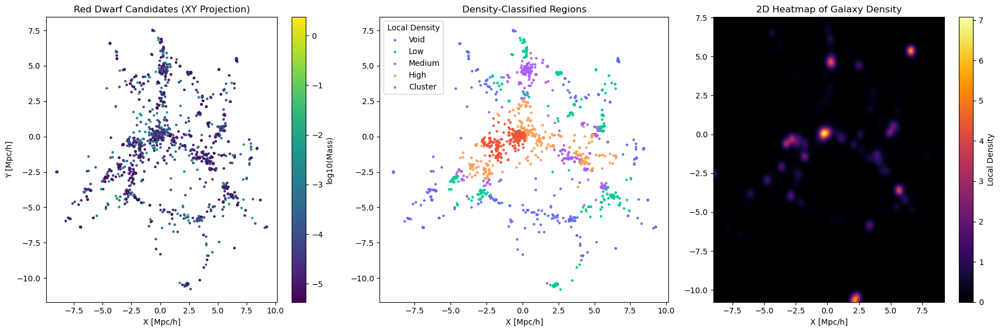

In [9]:
# --- Project to 2D (XY plane) ---
x = positions[:, 0]
y = positions[:, 1]
log_masses = np.log10(masses)
coords_2d = np.column_stack((x, y))

# ---  Compute local density (number of neighbors in radius) ---
radius = 2.5  # Mpc/h, adjust as needed
nbrs = NearestNeighbors(radius=radius).fit(coords_2d)
local_density = np.array([len(nbrs.radius_neighbors([pt], return_distance=False)[0]) for pt in coords_2d])

# ---  Bin density into 5 classes for color-coding ---
quantiles = np.quantile(local_density, [0.2, 0.4, 0.6, 0.8])
density_bins = np.digitize(local_density, quantiles)
labels = ["Void", "Low", "Medium", "High", "Cluster"]
colors = ["#636EFA", "#00CC96", "#AB63FA", "#FFA15A", "#EF553B"]

# ---  Create 2D histogram for density heatmap ---
# Normalize coordinates to grid
grid_size = 256
x_grid = ((x - x.min()) / (x.max() - x.min()) * (grid_size - 1)).astype(int)
y_grid = ((y - y.min()) / (y.max() - y.min()) * (grid_size - 1)).astype(int)

heatmap = np.zeros((grid_size, grid_size))
for xi, yi in zip(x_grid, y_grid):
    heatmap[yi, xi] += 1

# Smooth heatmap
heatmap_smooth = gaussian_filter(heatmap, sigma=3)

# ---  Plot All Three Panels ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=False, sharey=False)

# Panel 1: Mass scatter
sc1 = axes[0].scatter(x, y, c=log_masses, cmap='viridis', s=5)
axes[0].set_title("Red Dwarf Candidates (XY Projection)")
axes[0].set_xlabel("X [Mpc/h]")
axes[0].set_ylabel("Y [Mpc/h]")
plt.colorbar(sc1, ax=axes[0], label='log10(Mass)')

# Panel 2: Density classification
for i in range(5):
    idx = density_bins == i
    axes[1].scatter(x[idx], y[idx], color=colors[i], s=5, label=labels[i])
axes[1].set_title("Density-Classified Regions")
axes[1].set_xlabel("X [Mpc/h]")
axes[1].legend(title='Local Density')

# Panel 3: Heatmap
extent = [x.min(), x.max(), y.min(), y.max()]
im = axes[2].imshow(heatmap_smooth, extent=extent, origin='lower', cmap='inferno', aspect='auto')
axes[2].set_title("2D Heatmap of Galaxy Density")
axes[2].set_xlabel("X [Mpc/h]")
plt.colorbar(im, ax=axes[2], label='Local Density')

plt.tight_layout()
plt.show()

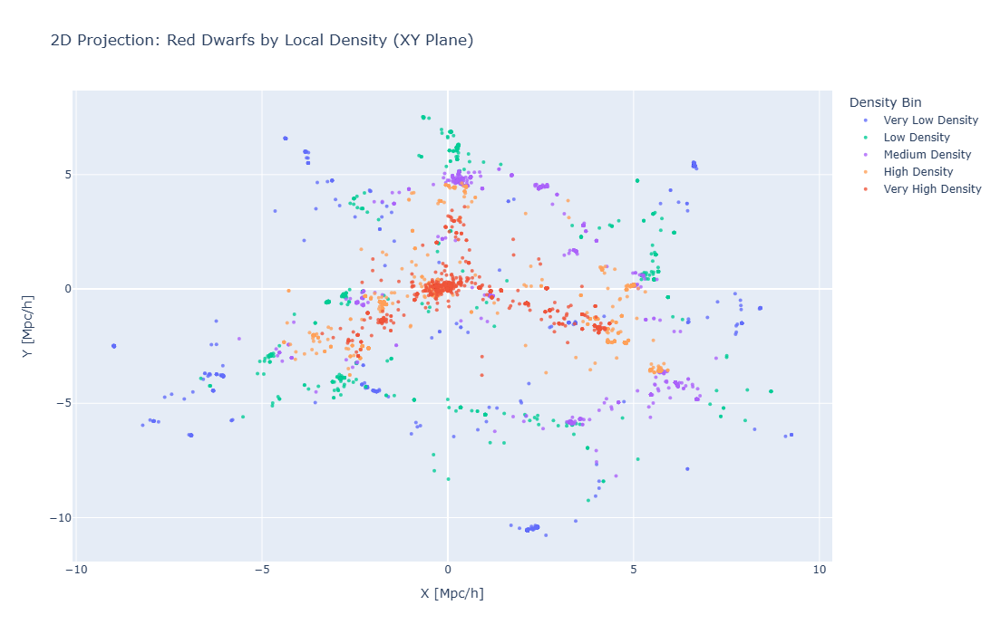

In [9]:
#  Compute Local Densities 
radius = 5.0
nbrs = NearestNeighbors(radius=radius).fit(positions)
density = np.array([len(nbrs.radius_neighbors([pos], return_distance=False)[0]) for pos in positions])

# Bin into 5 quantile-based density levels 
quantiles = np.quantile(density, [0.2, 0.4, 0.6, 0.8])
density_bins = np.digitize(density, quantiles)

#  Prepare 2D projection (XY plane) 
x = positions[:, 0]
y = positions[:, 1]

#  Define labels and colors 
labels = ["Very Low", "Low", "Medium", "High", "Very High"]
colors = ["#636EFA", "#00CC96", "#AB63FA", "#FFA15A", "#EF553B"]

# Create 2D Scatter Plot with Plotly 
fig = go.Figure()

for i in range(5):
    idx = density_bins == i
    fig.add_trace(go.Scatter(
        x=x[idx],
        y=y[idx],
        mode='markers',
        name=f"{labels[i]} Density",
        marker=dict(
            size=4,
            color=colors[i],
            opacity=0.8
        )
    ))

# --- Layout ---
fig.update_layout(
    title='2D Projection: Red Dwarfs by Local Density (XY Plane)',
    xaxis_title='X [Mpc/h]',
    yaxis_title='Y [Mpc/h]',
    legend_title='Density Bin',
    width=800,
    height=700
)

fig.show()


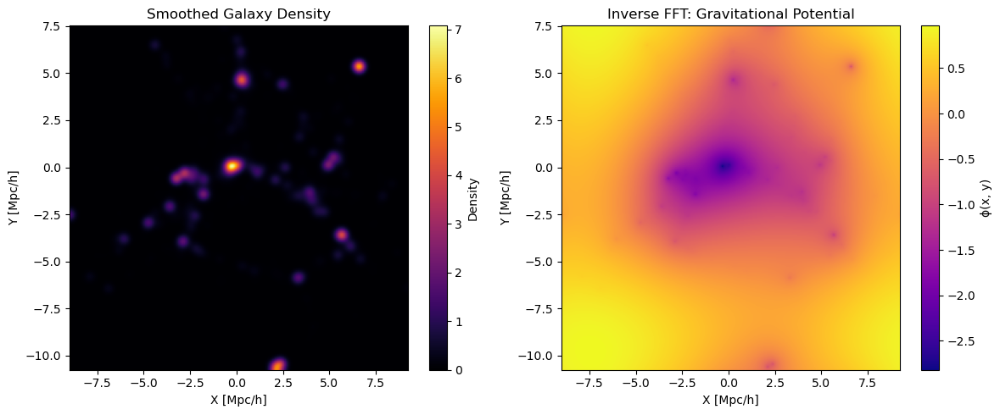

In [42]:
# --- Project to XY plane ---
x = positions[:, 0]
y = positions[:, 1]

# --- Grid setup ---
grid_size = 256
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

x_grid = ((x - x_min) / (x_max - x_min) * (grid_size - 1)).astype(int)
y_grid = ((y - y_min) / (y_max - y_min) * (grid_size - 1)).astype(int)
x_grid = np.clip(x_grid, 0, grid_size - 1)
y_grid = np.clip(y_grid, 0, grid_size - 1)

# --- Populate 2D density heatmap ---
heatmap = np.zeros((grid_size, grid_size))
for xi, yi in zip(x_grid, y_grid):
    heatmap[yi, xi] += 1

# --- Smooth the heatmap ---
heatmap_smooth = gaussian_filter(heatmap, sigma=3)

# --- FFT-based Poisson Solver (2D) ---
rho_k = np.fft.fft2(heatmap)
kx = 2 * np.pi * np.fft.fftfreq(grid_size, d=(x_max - x_min) / grid_size)
ky = 2 * np.pi * np.fft.fftfreq(grid_size, d=(y_max - y_min) / grid_size)
KX, KY = np.meshgrid(kx, ky, indexing='ij')
K2 = KX**2 + KY**2
K2[0, 0] = 1  # avoid division by zero

phi_k = -rho_k / K2
phi_k[0, 0] = 0  # remove DC offset
phi = np.fft.ifft2(phi_k).real

# --- Plotting (2 panels) ---
extent = [x_min, x_max, y_min, y_max]
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Panel 1: Smoothed Galaxy Density
im0 = axes[0].imshow(heatmap_smooth, extent=extent, origin='lower', cmap='inferno', aspect='auto')
axes[0].set_title("Smoothed Galaxy Density")
axes[0].set_xlabel("X [Mpc/h]")
axes[0].set_ylabel("Y [Mpc/h]")
plt.colorbar(im0, ax=axes[0], label='Density')

# Panel 2: Real-Space Potential (IFFT)
im1 = axes[1].imshow(phi, extent=extent, origin='lower', cmap='plasma', aspect='auto')
axes[1].set_title("Inverse FFT: Gravitational Potential")
axes[1].set_xlabel("X [Mpc/h]")
axes[1].set_ylabel("Y [Mpc/h]")
plt.colorbar(im1, ax=axes[1], label='ϕ(x, y)')

plt.tight_layout()
plt.show()

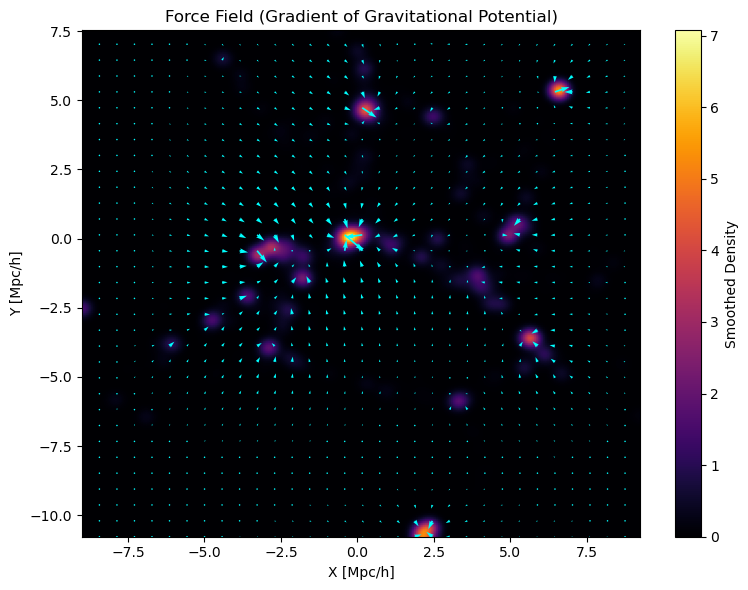

In [44]:
# --- Project to XY plane ---
x = positions[:, 0]
y = positions[:, 1]

# --- Grid setup ---
grid_size = 256
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
dx = (x_max - x_min) / grid_size
dy = (y_max - y_min) / grid_size

x_grid = ((x - x_min) / (x_max - x_min) * (grid_size - 1)).astype(int)
y_grid = ((y - y_min) / (y_max - y_min) * (grid_size - 1)).astype(int)
x_grid = np.clip(x_grid, 0, grid_size - 1)
y_grid = np.clip(y_grid, 0, grid_size - 1)

# --- Populate 2D density heatmap ---
heatmap = np.zeros((grid_size, grid_size))
for xi, yi in zip(x_grid, y_grid):
    heatmap[yi, xi] += 1

# --- Smooth the heatmap ---
heatmap_smooth = gaussian_filter(heatmap, sigma=3)

# --- FFT-based Poisson Solver (2D) ---
rho_k = np.fft.fft2(heatmap)
kx = 2 * np.pi * np.fft.fftfreq(grid_size, d=dx)
ky = 2 * np.pi * np.fft.fftfreq(grid_size, d=dy)
KX, KY = np.meshgrid(kx, ky, indexing='ij')
K2 = KX**2 + KY**2
K2[0, 0] = 1  # avoid division by zero
phi_k = -rho_k / K2
phi_k[0, 0] = 0
phi = np.fft.ifft2(phi_k).real

# --- Compute gradient (force field) ---
grad_y, grad_x = np.gradient(-phi, dy, dx)  # F = -∇φ

# --- Generate mesh for quiver plot ---
X = np.linspace(x_min, x_max, grid_size)
Y = np.linspace(y_min, y_max, grid_size)
X_grid, Y_grid = np.meshgrid(X, Y)

# --- Plot: Density with Force Vectors ---
plt.figure(figsize=(8, 6))
plt.imshow(heatmap_smooth, extent=[x_min, x_max, y_min, y_max], origin='lower', cmap='inferno', aspect='auto')
plt.colorbar(label='Smoothed Density')
plt.quiver(X_grid[::8, ::8], Y_grid[::8, ::8], grad_x[::8, ::8], grad_y[::8, ::8],
           color='cyan', angles='xy', scale=50, width=0.003)
plt.title("Force Field (Gradient of Gravitational Potential)")
plt.xlabel("X [Mpc/h]")
plt.ylabel("Y [Mpc/h]")
plt.tight_layout()
plt.show()

In [11]:
N = 100
L = 100.0  # Mpc/h
x = np.linspace(0, L, N)
y = np.linspace(0, L, N)
X, Y = np.meshgrid(x, y)

# Sample Gaussian noise + peak (centered at L/2)
sigma = 5.0
rho = np.random.normal(0, 0.1, (N, N)) + np.exp(-((X - L/2)**2 + (Y - L/2)**2) / (2 * sigma**2))
rho -= np.mean(rho)  # zero-mean for FFT

In [12]:
# Assume px and py in same units (Mpc/h) as x and y
px = np.array([g['px'] for g in dwarfs])
py = np.array([g['py'] for g in dwarfs])

In [13]:
# Convert physical position to grid index
ix = np.clip(((px / L) * N).astype(int), 0, N-1)
iy = np.clip(((py / L) * N).astype(int), 0, N-1)

In [14]:
local_densities = rho[iy, ix]

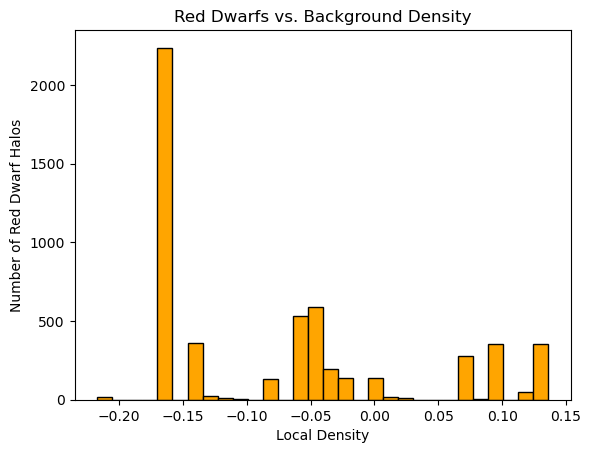

In [15]:
plt.hist(local_densities, bins=30, color='orange', edgecolor='k')
plt.xlabel("Local Density")
plt.ylabel("Number of Red Dwarf Halos")
plt.title("Red Dwarfs vs. Background Density")
plt.show()

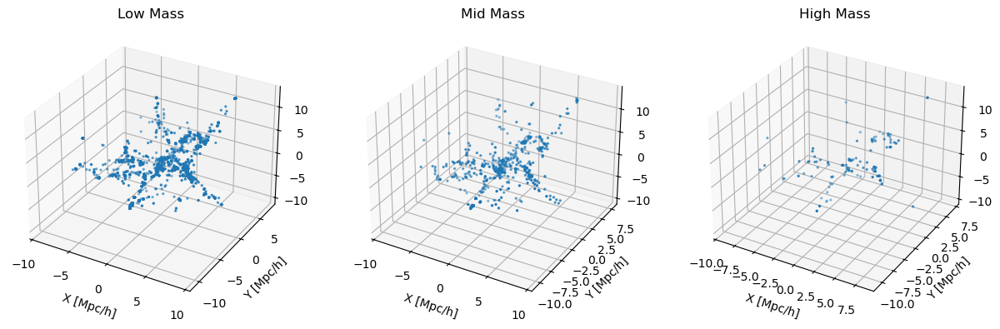

In [26]:
# Log10 masses from treebricks
log_masses = np.log10(np.array([g['mass'][0] for g in dwarfs]))
positions = np.array([[g['px'], g['py'], g['pz']] for g in dwarfs])

# Define mass bin ranges (you can adjust)
bins = [-np.inf, -3.5, -1.5, np.inf]  # Example: very low, mid, and high mass
labels = ["Low Mass", "Mid Mass", "High Mass"]

# Assign each halo to a bin
bin_indices = np.digitize(log_masses, bins)

# Plotting the data
fig = plt.figure(figsize=(15, 5))

for i in range(1, 4):  # bin_indices ∈ {1, 2, 3}
    ax = fig.add_subplot(1, 3, i, projection='3d')
    pos_bin = positions[bin_indices == i]
    
    # Scatter plot
    ax.scatter(pos_bin[:, 0], pos_bin[:, 1], pos_bin[:, 2], s=2)
    
    # Titles and labels
    ax.set_title(labels[i - 1])
    ax.set_xlabel("X [Mpc/h]")
    ax.set_ylabel("Y [Mpc/h]")

In [30]:
mvir_array = np.array([g['mvir'] for g in galaxies])

Text(0.5, 1.0, 'Halo Mass Function')

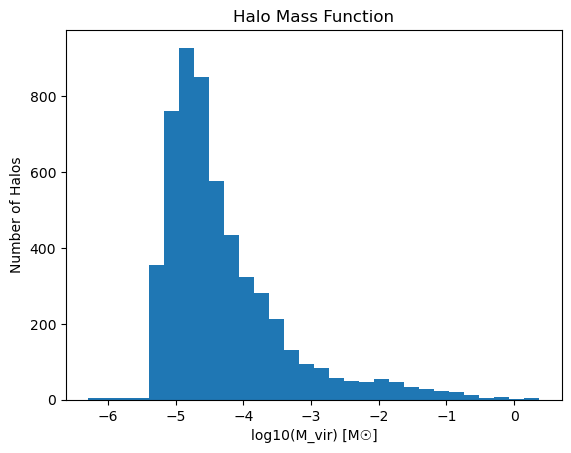

In [31]:
plt.hist(np.log10(mvir_array), bins=30)
plt.xlabel('log10(M_vir) [M☉]')
plt.ylabel('Number of Halos')
plt.title('Halo Mass Function')

In [32]:
sigma_array = np.array([g['sigma'] for g in galaxies])

Text(0.5, 1.0, 'Velocity Dispersion Distribution')

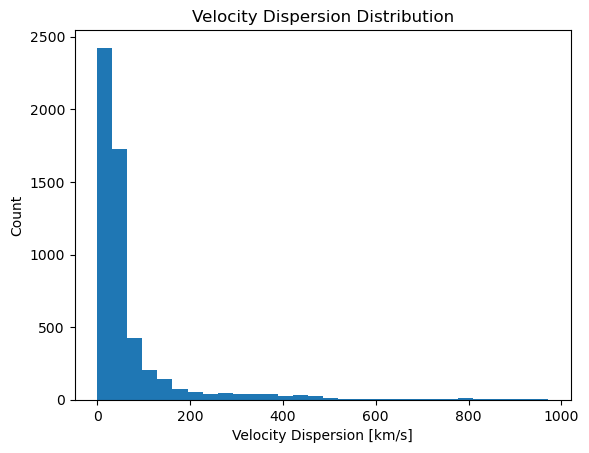

In [33]:
plt.hist(sigma_array, bins=30)
plt.xlabel("Velocity Dispersion [km/s]")
plt.ylabel("Count")
plt.title("Velocity Dispersion Distribution")

In [35]:
Lx = np.array([g['Lx'] for g in dwarfs])
Ly = np.array([g['Ly'] for g in dwarfs])
Lz = np.array([g['Lz'] for g in dwarfs])

L_mag = np.sqrt(Lx**2 + Ly**2 + Lz**2)
L_unit = np.column_stack([Lx, Ly, Lz]) / L_mag[:, None]
cos_theta = Lz / L_mag  # dot product with z-axis

Text(0.5, 1.0, 'Spin Axis Alignment')

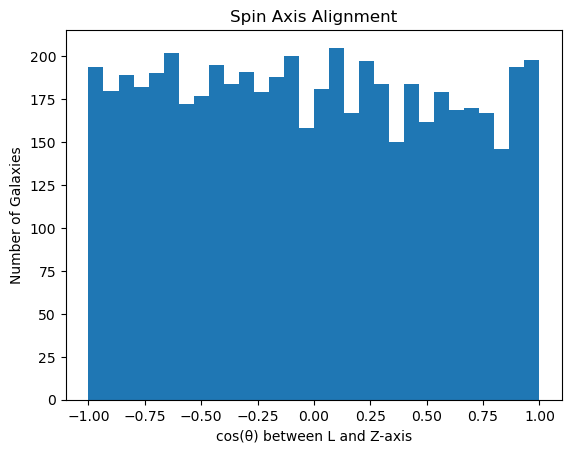

In [38]:
plt.hist(cos_theta, bins=30)
plt.xlabel("cos(θ) between L and Z-axis")
plt.ylabel("Number of Galaxies")
plt.title("Spin Axis Alignment")

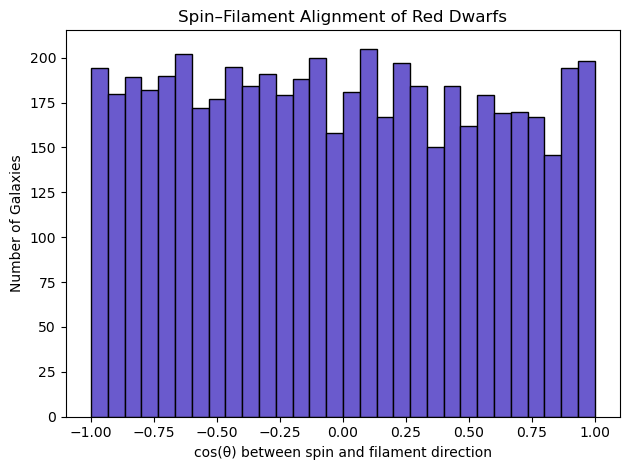

In [40]:
plt.hist(cos_theta, bins=30, color='slateblue', edgecolor='black')
plt.xlabel("cos(θ) between spin and filament direction")
plt.ylabel("Number of Galaxies")
plt.title("Spin–Filament Alignment of Red Dwarfs")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Spin–Filament Alignment by Mass')

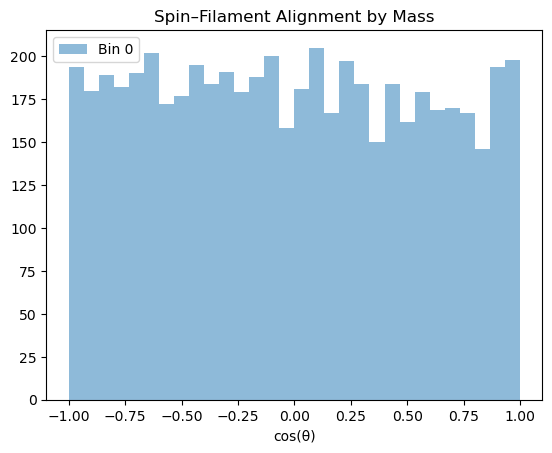

In [41]:
masses = np.array([g['mass'][0] for g in dwarfs])
mass_bins = np.digitize(np.log10(masses), bins=[8.5, 9.5, 10.5])

for i in np.unique(mass_bins):
    plt.hist(cos_theta[mass_bins == i], bins=30, alpha=0.5, label=f'Bin {i}')
plt.legend()
plt.xlabel("cos(θ)")
plt.title("Spin–Filament Alignment by Mass")


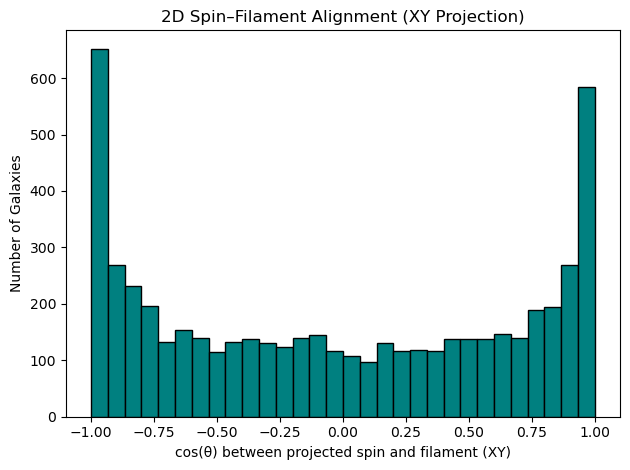

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

#  Extract positions and angular momentum vectors 
positions = np.array([[g['px'], g['py'], g['pz']] for g in dwarfs])
Lx = np.array([g['Lx'] for g in dwarfs])
Ly = np.array([g['Ly'] for g in dwarfs])
Lz = np.array([g['Lz'] for g in dwarfs])
L_xy = np.column_stack((Lx, Ly))  # project to XY plane

# Normalize spin vectors in XY
L_xy_mag = np.linalg.norm(L_xy, axis=1)
L_xy_unit = L_xy / L_xy_mag[:, None]

# Estimate local filament direction via PCA 
nbrs = NearestNeighbors(n_neighbors=20).fit(positions[:, :2])  # only XY
filament_dirs_xy = []

for pos in positions[:, :2]:
    _, idxs = nbrs.kneighbors([pos])
    local_xy = positions[idxs[0], :2]
    pca = PCA(n_components=1).fit(local_xy)
    filament_dirs_xy.append(pca.components_[0])

F_xy = np.array(filament_dirs_xy)
F_xy_mag = np.linalg.norm(F_xy, axis=1)
F_xy_unit = F_xy / F_xy_mag[:, None]

#  Compute cos(theta) between L_xy and F_xy 
cos_theta_xy = np.sum(L_xy_unit * F_xy_unit, axis=1)

#  Plot histogram of alignment angles 
plt.hist(cos_theta_xy, bins=30, color='teal', edgecolor='black')
plt.xlabel("cos(θ) between projected spin and filament (XY)")
plt.ylabel("Number of Galaxies")
plt.title("2D Spin–Filament Alignment (XY Projection)")
plt.tight_layout()
plt.show()


In [102]:
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

#  Extract positions and angular momentum vectors 
positions = np.array([[g['px'], g['py'], g['pz']] for g in dwarfs])
Lx = np.array([g['Lx'] for g in dwarfs])
Ly = np.array([g['Ly'] for g in dwarfs])
Lz = np.array([g['Lz'] for g in dwarfs])
L = np.column_stack((Lx, Ly, Lz))

# Normalize spin vectors for unit arrows
L_unit = L / np.linalg.norm(L, axis=1)[:, None]

#  Compute local filament directions using PCA 
nbrs = NearestNeighbors(n_neighbors=20).fit(positions)
filament_dirs = []

for pos in positions:
    _, idxs = nbrs.kneighbors([pos])
    local_pts = positions[idxs[0]]
    pca = PCA(n_components=1).fit(local_pts)
    filament_dirs.append(pca.components_[0])

F_unit = np.array(filament_dirs)

#  Downsample for clarity
n_plot = 300  # number of arrows to plot
idx = np.random.choice(len(positions), n_plot, replace=False)

#  Create Plotly traces
fig = go.Figure()

# Galaxy points
fig.add_trace(go.Scatter3d(
    x=positions[:, 0],
    y=positions[:, 1],
    z=positions[:, 2],
    mode='markers',
    marker=dict(size=2, color='white'),
    name='Red Dwarfs'
))

# Spin vector arrows
for i in idx:
    fig.add_trace(go.Cone(
        x=[positions[i, 0]], y=[positions[i, 1]], z=[positions[i, 2]],
        u=[L_unit[i, 0]], v=[L_unit[i, 1]], w=[L_unit[i, 2]],
        sizemode="scaled", sizeref=0.1, anchor="tail",
        colorscale='Blues', showscale=False,
        name='Spin'
    ))

# Filament vector arrows
for i in idx:
    fig.add_trace(go.Cone(
        x=[positions[i, 0]], y=[positions[i, 1]], z=[positions[i, 2]],
        u=[F_unit[i, 0]], v=[F_unit[i, 1]], w=[F_unit[i, 2]],
        sizemode="scaled", sizeref=0.1, anchor="tail",
        colorscale='Reds', showscale=False,
        name='Filament'
    ))

# Layout settings ---
fig.update_layout(
    title='3D Galaxy Spin and Filament Directions',
    scene=dict(
        xaxis_title='X [Mpc/h]',
        yaxis_title='Y [Mpc/h]',
        zaxis_title='Z [Mpc/h]'
    ),
    margin=dict(l=0, r=0, b=0, t=40),
    showlegend=False
)

fig.show()

In [132]:
n_steps = len(positions_t_clean)

In [134]:
frames = []
for t in range(n_steps):
    pos = positions_t_clean[t]
    frame = go.Frame(data=[
        go.Scatter3d(
            x=pos[:, 0],
            y=pos[:, 1],
            z=pos[:, 2],
            mode='markers',
            marker=dict(size=3, color='red'),
        )
    ], name=str(t))
    frames.append(frame)

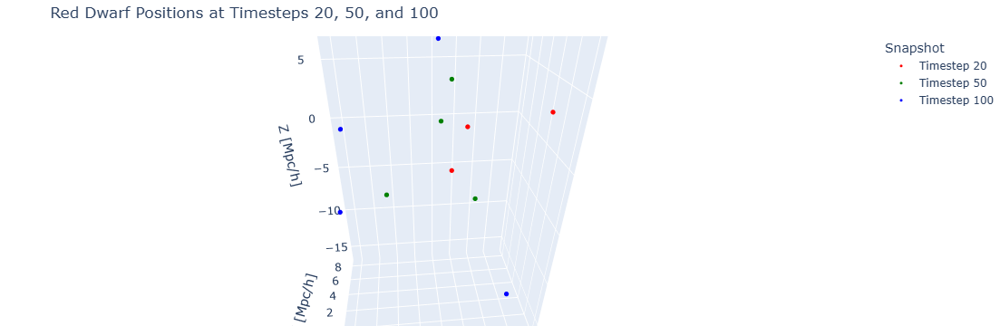

In [58]:
# Simulated red dwarf motion
n_galaxies = 4
np.random.seed(0)
initial_positions = np.random.uniform(-10, 10, size=(n_galaxies, 3))
velocities = np.random.normal(0, 0.1, size=(n_galaxies, 3))
positions_t = [initial_positions + t * velocities for t in range(101)]

# Selected timesteps
selected_steps = [0, 50, 100]
colors = ['red', 'green', 'blue']
labels = ['Timestep 20', 'Timestep 50', 'Timestep 100']

# Plot
fig = go.Figure()
for step, color, label in zip(selected_steps, colors, labels):
    pos = positions_t[step]
    fig.add_trace(go.Scatter3d(
        x=pos[:, 0], y=pos[:, 1], z=pos[:, 2],
        mode='markers',
        marker=dict(size=3, color=color),
        name=label
    ))

fig.update_layout(
    title="Red Dwarf Positions at Timesteps 20, 50, and 100",
    scene=dict(
        xaxis_title='X [Mpc/h]',
        yaxis_title='Y [Mpc/h]',
        zaxis_title='Z [Mpc/h]'
    ),
    legend_title="Snapshot",
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

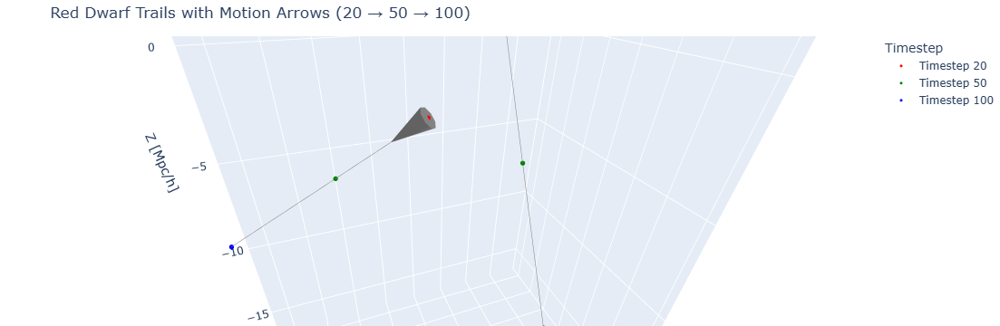

In [62]:
# Simulate galaxy positions across 100 timesteps
n_galaxies = 4
np.random.seed(0)
initial_positions = np.random.uniform(-10, 10, size=(n_galaxies, 3))
velocities = np.random.normal(0, 0.1, size=(n_galaxies, 3))
positions_t = [initial_positions + t * velocities for t in range(101)]

# Selected timesteps
selected_steps = [20, 50, 100]
colors = ['red', 'green', 'blue']
labels = ['Timestep 20', 'Timestep 50', 'Timestep 100']

# Start figure
fig = go.Figure()

# Plot galaxies at each timestep
for step, color, label in zip(selected_steps, colors, labels):
    pos = positions_t[step]
    fig.add_trace(go.Scatter3d(
        x=pos[:, 0], y=pos[:, 1], z=pos[:, 2],
        mode='markers', marker=dict(size=3, color=color), name=label
    ))

# Add trails (lines) between positions
for i in range(n_galaxies):
    trail = np.array([positions_t[t][i] for t in selected_steps])
    fig.add_trace(go.Scatter3d(
        x=trail[:, 0], y=trail[:, 1], z=trail[:, 2],
        mode='lines', line=dict(color='gray', width=1), showlegend=False
    ))

#  Add arrows (from t=20 pointing to t=50)
start = positions_t[20]
end = positions_t[50]
directions = end - start

fig.add_trace(go.Cone(
    x=start[:, 0],
    y=start[:, 1],
    z=start[:, 2],
    u=directions[:, 0],
    v=directions[:, 1],
    w=directions[:, 2],
    sizemode='scaled',
    sizeref=0.5,
    anchor='tail',
    colorscale='Greys',
    showscale=False,
    name='Motion Arrows'
))

# Layout
fig.update_layout(
    title="Red Dwarf Trails with Motion Arrows (20 → 50 → 100)",
    scene=dict(
        xaxis_title='X [Mpc/h]',
        yaxis_title='Y [Mpc/h]',
        zaxis_title='Z [Mpc/h]'
    ),
    legend_title="Timestep",
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()


In [174]:
print([g['mass'][0] for g in galaxies[:5]])

[0.5610824376834906, 1.7172400015409175, 2.3372535250124824, 2.3632467803315027, 0.0008621811305855319]


In [166]:
print([g['spin'] for g in galaxies[:5]])

[[0.41963278072876614], [0.38297393272665786], [0.17184620983911486], [0.2614319106654762], [0.39461742036436104]]


In [64]:
spin = np.array([
    g['spin'][0] if isinstance(g['spin'], list) else g['spin']
    for g in galaxies
])

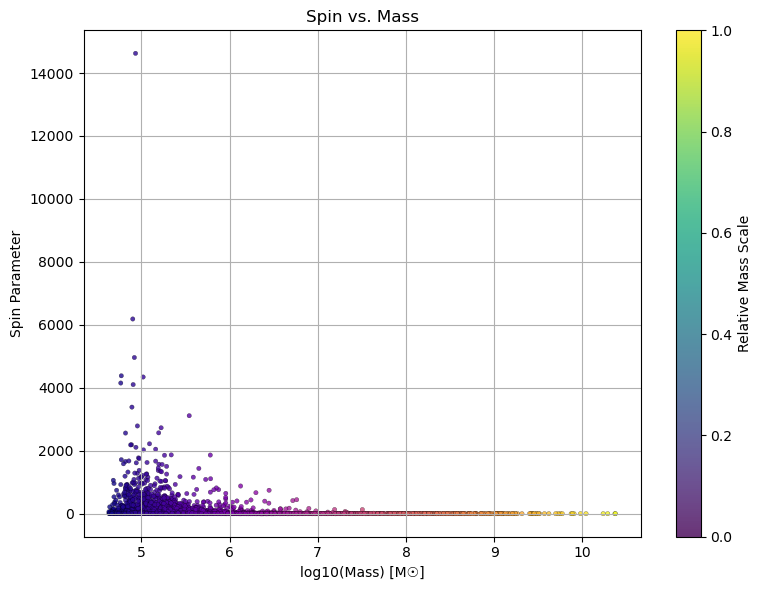

In [66]:
# Extract galaxy data from treebricks
galaxies = gc.treebricks_dict['galaxies']

#  Extract mass and spin
mass_code_units = np.array([g['mass'][0] for g in galaxies])
mass_msun = mass_code_units * 1e10
log_mass = np.log10(mass_msun)

# Extract spin, handling both list and float types
spin = np.array([
    g['spin'][0] if isinstance(g['spin'], list) else g['spin']
    for g in galaxies
])

#  Color map by mass for visual encoding
colors = plt.cm.plasma((log_mass - log_mass.min()) / (log_mass.max() - log_mass.min()))

#  Plot
plt.figure(figsize=(8, 6))
sc = plt.scatter(log_mass, spin, c=colors, s=10, alpha=0.8, edgecolor='k', linewidth=0.2)
plt.xlabel("log10(Mass) [M☉]")
plt.ylabel("Spin Parameter")
plt.title("Spin vs. Mass")
plt.colorbar(sc, label="Relative Mass Scale")
plt.grid(True)
plt.tight_layout()
plt.show()

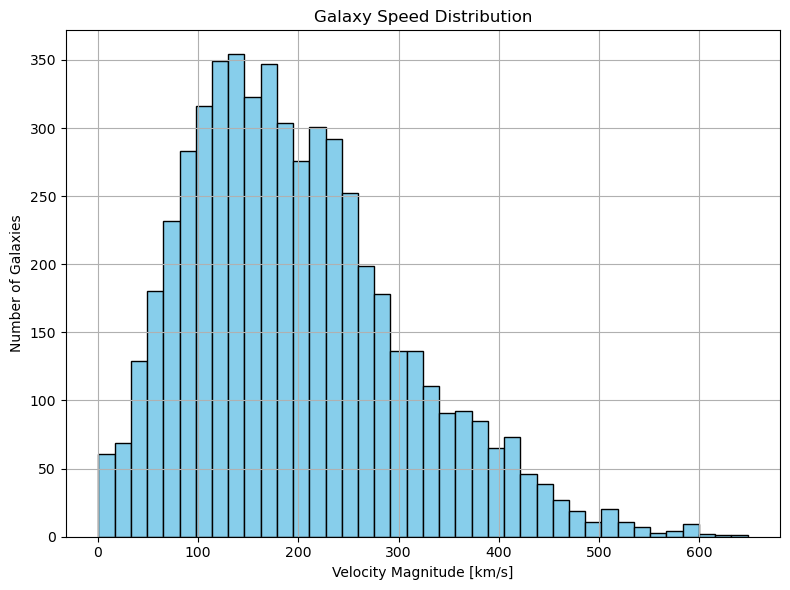

In [184]:
#  Extract velocity components from galaxies
galaxies = gc.treebricks_dict['galaxies']

vx = np.array([g['vx'] for g in galaxies])
vy = np.array([g['vy'] for g in galaxies])
vz = np.array([g['vz'] for g in galaxies])

#  Compute total velocity magnitude
velocity_magnitude = np.sqrt(vx**2 + vy**2 + vz**2)

#  Plot histogram of velocity magnitudes
plt.figure(figsize=(8, 6))
plt.hist(velocity_magnitude, bins=40, color='skyblue', edgecolor='black')
plt.xlabel("Velocity Magnitude [km/s]")
plt.ylabel("Number of Galaxies")
plt.title("Galaxy Speed Distribution")
plt.grid(True)
plt.tight_layout()
plt.show()


In [78]:
vx = np.array([g['vx'] for g in galaxies])
vy = np.array([g['vy'] for g in galaxies])
vz = np.array([g['vz'] for g in galaxies])

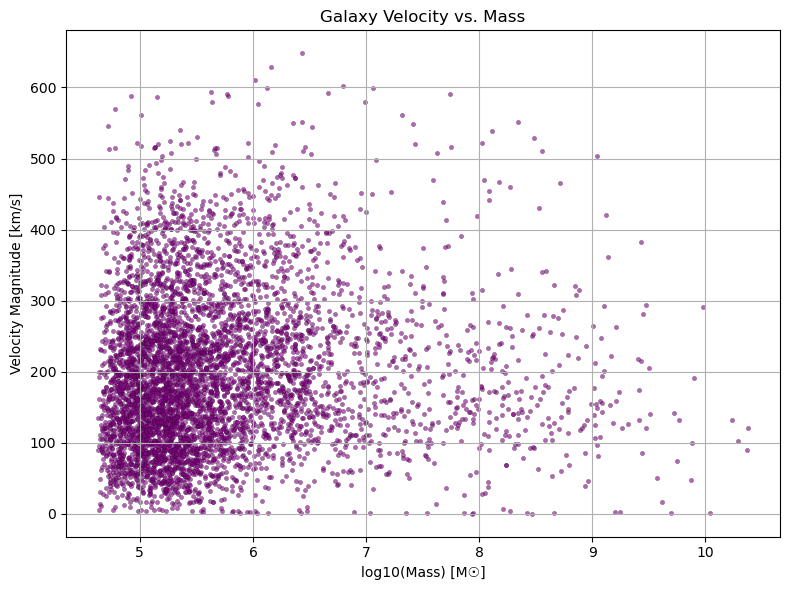

In [186]:
# Compute velocity magnitude
velocity_magnitude = np.sqrt(vx**2 + vy**2 + vz**2)

# Extract and convert mass to solar masses
mass_code_units = np.array([g['mass'][0] for g in galaxies])
mass_msun = mass_code_units * 1e10  # Assumed conversion: 1 code unit = 1e10 M_sun
log_mass = np.log10(mass_msun)

#  Plot velocity magnitude vs. log10(mass)
plt.figure(figsize=(8, 6))
plt.scatter(log_mass, velocity_magnitude, alpha=0.6, s=10, c='purple', edgecolor='k', linewidth=0.2)
plt.xlabel("log10(Mass) [M☉]")
plt.ylabel("Velocity Magnitude [km/s]")
plt.title("Galaxy Velocity vs. Mass")
plt.grid(True)
plt.tight_layout()
plt.show()

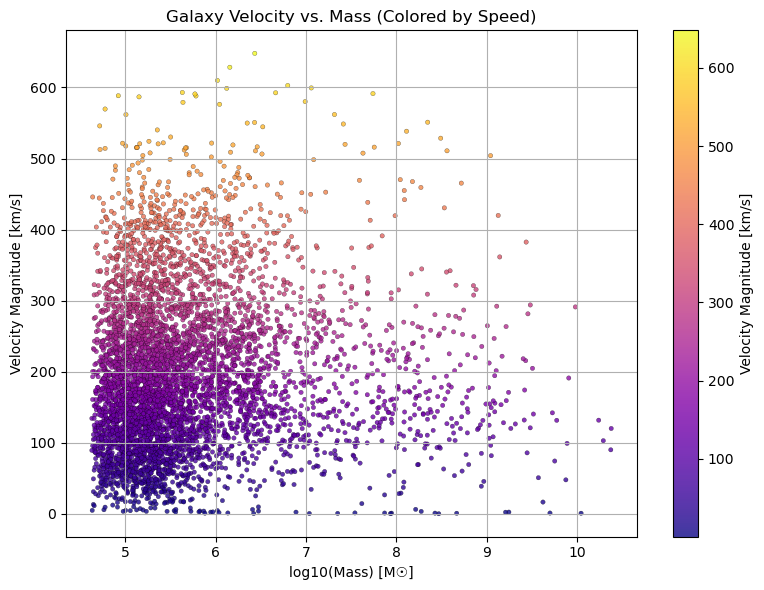

In [190]:
# Compute total velocity magnitude
velocity_magnitude = np.sqrt(vx**2 + vy**2 + vz**2)

# Extract mass and convert to solar masses
mass_code_units = np.array([g['mass'][0] for g in galaxies])
mass_msun = mass_code_units * 1e10  # Assumed unit: 1 code unit = 1e10 M_sun
log_mass = np.log10(mass_msun)

# Normalize colors by velocity magnitude
colors = plt.cm.plasma((velocity_magnitude - velocity_magnitude.min()) / 
                       (velocity_magnitude.max() - velocity_magnitude.min()))

#  Plot
plt.figure(figsize=(8, 6))
sc = plt.scatter(log_mass, velocity_magnitude, c=velocity_magnitude,
                 cmap='plasma', alpha=0.8, s=10, edgecolor='k', linewidth=0.2)
plt.xlabel("log10(Mass) [M☉]")
plt.ylabel("Velocity Magnitude [km/s]")
plt.title("Galaxy Velocity vs. Mass (Colored by Speed)")
plt.colorbar(sc, label="Velocity Magnitude [km/s]")
plt.grid(True)
plt.tight_layout()
plt.show()

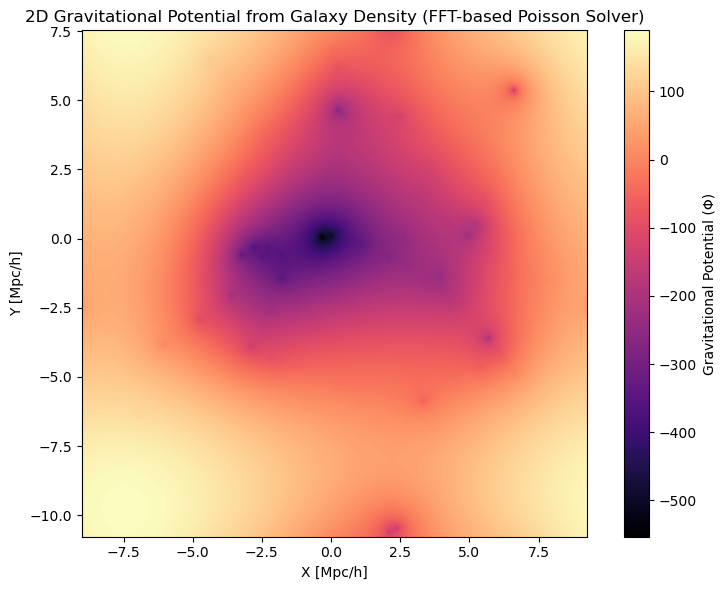

In [9]:
x = np.array([g['px'] for g in galaxies])
y = np.array([g['py'] for g in galaxies])

# Set up the 2D grid
grid_size = 256  # resolution of the grid
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# Normalize positions to fit the grid indices
x_grid = ((x - x_min) / (x_max - x_min) * (grid_size - 1)).astype(int)
y_grid = ((y - y_min) / (y_max - y_min) * (grid_size - 1)).astype(int)

# Create 2D density field (ρ)
rho = np.zeros((grid_size, grid_size))
for xi, yi in zip(x_grid, y_grid):
    rho[yi, xi] += 1  # y first (row), then x (column)

#  Solve Poisson equation via FFT
rho_k = fft2(rho)
kx = fftfreq(grid_size) * 2 * np.pi
ky = fftfreq(grid_size) * 2 * np.pi
KX, KY = np.meshgrid(kx, ky)
K2 = KX**2 + KY**2
K2[0, 0] = 1  # avoid division by zero

# Fourier space solution
phi_k = -rho_k / K2
phi_k[0, 0] = 0  # zero out DC component to remove mean offset
phi = np.real(ifft2(phi_k))

# Plot the gravitational potential field
plt.figure(figsize=(8, 6))
plt.imshow(phi, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='magma')
plt.colorbar(label="Gravitational Potential (Φ)")
plt.xlabel("X [Mpc/h]")
plt.ylabel("Y [Mpc/h]")
plt.title("2D Gravitational Potential from Galaxy Density (FFT-based Poisson Solver)")
plt.tight_layout()
plt.show()

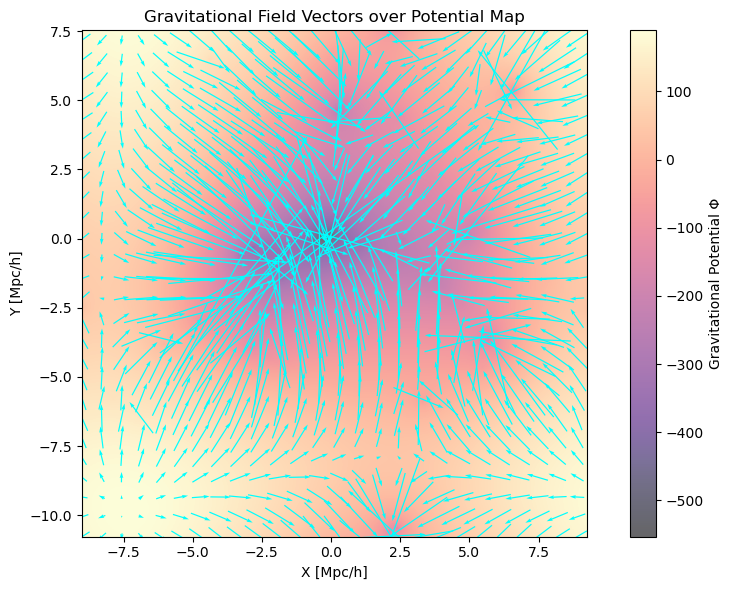

In [11]:
# Grid setup
grid_size = 256
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
x_grid = ((x - x_min) / (x_max - x_min) * (grid_size - 1)).astype(int)
y_grid = ((y - y_min) / (y_max - y_min) * (grid_size - 1)).astype(int)

# Build density grid
rho = np.zeros((grid_size, grid_size))
for xi, yi in zip(x_grid, y_grid):
    rho[yi, xi] += 1

#  FFT Poisson solve for gravitational potential
rho_k = fft2(rho)
kx = fftfreq(grid_size) * 2 * np.pi
ky = fftfreq(grid_size) * 2 * np.pi
KX, KY = np.meshgrid(kx, ky)
K2 = KX**2 + KY**2
K2[0, 0] = 1  # prevent division by zero

phi_k = -rho_k / K2
phi_k[0, 0] = 0  # zero mean potential
phi = np.real(ifft2(phi_k))

#  Compute gravitational field (negative gradient)
dx = (x_max - x_min) / grid_size
dy = (y_max - y_min) / grid_size
gy, gx = np.gradient(-phi, dy, dx)  # Note: gy is dΦ/dy, gx is dΦ/dx

#  Plot gravitational field vectors (quiver)
X, Y = np.meshgrid(
    np.linspace(x_min, x_max, grid_size),
    np.linspace(y_min, y_max, grid_size)
)

plt.figure(figsize=(9, 6))
plt.imshow(phi, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='magma', alpha=0.6)
plt.colorbar(label='Gravitational Potential Φ')
plt.quiver(X[::10, ::10], Y[::10, ::10], gx[::10, ::10], gy[::10, ::10], 
           color='cyan', pivot='mid', scale=500)
plt.xlabel("X [Mpc/h]")
plt.ylabel("Y [Mpc/h]")
plt.title("Gravitational Field Vectors over Potential Map")
plt.tight_layout()
plt.show()

In [130]:
timesteps = [g['my_timestep'] for g in galaxies]
timesteps

[[970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],
 [970],


Found 0 valid galaxies at timestep 20


ValueError: No valid galaxies found at timestep 20

In [128]:
timesteps = set(g.get('my_timestep', [None])[0] for g in gc.treebricks_dict['galaxies'])
print("Available timesteps:", sorted(t for t in timesteps if t is not None))


Available timesteps: [970]
